# LVIS Data Tutorial: Working with L1B HDF5 Files
 
## Introduction
 
LVIS (Land, Vegetation, and Ice Sensor) is a NASA airborne laser altimeter that measures surface topography and vegetation structure. This tutorial will show you how to:
 
- Open and explore LVIS L1B HDF5 files
- Visualize a sample waveform
- Load the associated L2 .TXT file to visualize L2 metrics ontop
- Plot waveform coordinates using folium

## Prerequisites
- Basic Python knowledge
- Understanding of LVIS data structure (for documentation visit: https://lvis.gsfc.nasa.gov/Home/index.html )

## 1. Import required libraries

In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import folium
import os

print("Libraries imported successfully!")

Libraries imported successfully!


## 2. Set the path to your LVIS files

In [ ]:
# Set the path to your L1B file
h5_file_path =  "path/to/your/LVIS_file.h5"

# Set the path to your L2 file
l2_file_path =  "path/to/your/LVIS_file.TXT"

## 3. Open and explore the HDF5 file

In [3]:
# Open file
h5_file = h5py.File(h5_file_path, 'r')

# See what datasets are inside
print("Datasets in this LVIS file:")
print("-" * 30)
for dataset_name in h5_file.keys():
    print(dataset_name)
    
print(f"\nTotal number of datasets: {len(h5_file.keys())}")

Datasets in this LVIS file:
------------------------------
AZIMUTH
INCIDENTANGLE
LAT0
LAT1215
LFID
LON0
LON1215
RANGE
RXWAVE
SHOTNUMBER
SIGMEAN
TIME
TXWAVE
Z0
Z1215
ancillary_data

Total number of datasets: 16


## 4. Look at important datasets
The main datasets we'll look at in this example include:
  -  SHOTNUMBER - the unique shot identifier for each waveform
  -  RXWAVE - the return waveform
  -  SIGMEAN - the mean signal noise level
  -  LAT0 and LAT1215 - the latitude coordinates of the first and last samples in RXWAVE
  -  LON0 and LON1215 - the longitude coordinates of the first and last samples in RXWAVE
  -  Z0 and Z1215 - Elevations of the first and last samples in RXWAVE

NOTE: Each waveform (RXWAVE) has 1216 bins or samples where:
  - sample 0 = start of the waveform (closest to the sensor)
  - sample 1215 = end of the waveform (closest to the ground)

*Initialize main datasets of interest...*

In [4]:
# Shot numbers - unique ID for each laser shot
shot_numbers = h5_file['SHOTNUMBER'][:]

# Latitude coordinates (start and end of waveform)
lat0 = h5_file['LAT0'][:]
lat1215 = h5_file['LAT1215'][:]

# Longitude coordinates (start and end of waveform)
lon0 = h5_file['LON0'][:]
lon1215 = h5_file['LON1215'][:]

# Elevation data
z0 = h5_file['Z0'][:]
z1215 = h5_file['Z1215'][:]

# Get the total number of waveforms for this file
print(f"This file contains {shot_numbers.shape[0]} waveforms")

This file contains 350000 waveforms


## 5. Extracting metadata and visualizing a waveform

Uncomment either option 1 or option 2 below to select an index position or specific shotnumber

In [5]:
# Waveform data (RXWAVE)
if 'RXWAVE' in h5_file:
    waveforms = h5_file['RXWAVE']
    print(f"\nRXWAVE: {waveforms.shape} - Waveform data (number of waveforms, number of samples per waveform)")
    

    # Option 1: Select by index location (0 to (total number of shots - 1))
    example_shot_index = 100  # You can change this to look at different shots
    example_waveform = waveforms[example_shot_index]

    # Option 2: Select by shotnumber (have to know a specific number to access properly)
    # desired_shot_number = 17170411  # Change this to your desired shot number
    # example_shot_index = np.where(shot_numbers == desired_shot_number)[0][0]
    
    print(f"\nExample waveform (shot index {example_shot_index}):")
    print(f"  Shot number: {shot_numbers[example_shot_index]}")
    print(f"  Location:")
    print(f"    Start: {lat0[example_shot_index]:.6f}°, {lon0[example_shot_index]:.6f}°")
    print(f"    End:   {lat1215[example_shot_index]:.6f}°, {lon1215[example_shot_index]:.6f}°")
    print(f"  Elevation:")
    print(f"    Top:    {z0[example_shot_index]:.1f} m")
    print(f"    Bottom: {z1215[example_shot_index]:.1f} m")
    print(f"    Height: {z0[example_shot_index] - z1215[example_shot_index]:.1f} m")
    print(f"  Waveform:")
    print(f"    Shape: {example_waveform.shape}")
    print(f"    Min intensity: {np.min(example_waveform):.2f}")
    print(f"    Max intensity: {np.max(example_waveform):.2f}")
else:
    print("\nNo waveform data (RXWAVE) found in this file")


RXWAVE: (350000, 1216) - Waveform data (number of waveforms, number of samples per waveform)

Example waveform (shot index 100):
  Shot number: 17170411
  Location:
    Start: 60.781334°, 222.415276°
    End:   60.781398°, 222.415465°
  Elevation:
    Top:    787.8 m
    Bottom: 606.1 m
    Height: 181.7 m
  Waveform:
    Shape: (1216,)
    Min intensity: 139.00
    Max intensity: 1308.00


*Let's visualize the laser return signal for our selected shot...*

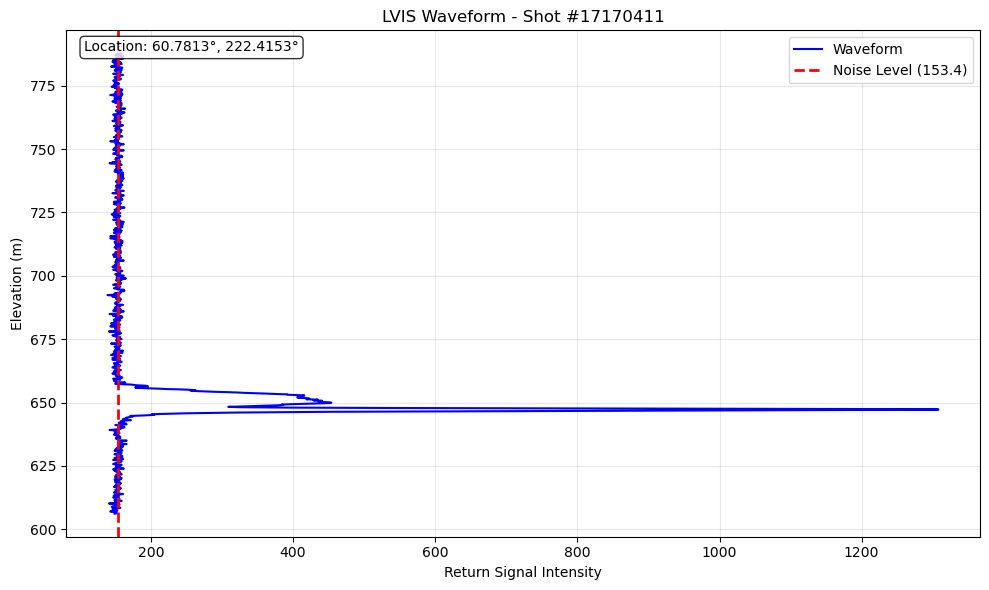

In [6]:
# Get the waveform for this shot
waveform = h5_file['RXWAVE'][example_shot_index]

# Get the noise level (SIGMEAN)
sigmean = h5_file['SIGMEAN'][example_shot_index]

# Create elevation array (1216 points from top to bottom)
elevations = np.linspace(z0[example_shot_index], z1215[example_shot_index], 1216)

# Create the plot
plt.figure(figsize=(10, 6))

# Plot the waveform
plt.plot(waveform, elevations, 'b-', linewidth=1.5, label='Waveform')

# Plot the noise level as a horizontal line
plt.axvline(x=sigmean, color='red', linestyle='--', linewidth=2, 
            label=f'Noise Level ({sigmean:.1f})')

plt.xlabel('Return Signal Intensity')
plt.ylabel('Elevation (m)')
plt.title(f'LVIS Waveform - Shot #{shot_numbers[example_shot_index]}')
plt.grid(True, alpha=0.3)
plt.legend()

# Add location information
plt.text(0.02, 0.98, 
            f'Location: {lat0[example_shot_index]:.4f}°, {lon0[example_shot_index]:.4f}°',
            transform=plt.gca().transAxes, 
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

## 6. Visualizing L2 metrics for a waveform

Loading L2 data from: H:\01_Data\LVIS\LVIS L2 Elevation and Height Products\L2A_Raw_Files_CodeWith\LVISF2_ABoVE2019_0731_R2003_066547.TXT
L2 columns found: ['LFID', 'SHOTNUMBER', 'TIME', 'GLON', 'GLAT', 'ZG', 'HLON', 'HLAT', 'ZH', 'TLON', 'TLAT', 'ZT', 'RH10', 'RH15', 'RH20', 'RH25', 'RH30', 'RH35', 'RH40', 'RH45', 'RH50', 'RH55', 'RH60', 'RH65', 'RH70', 'RH75', 'RH80', 'RH85', 'RH90', 'RH95', 'RH96', 'RH97', 'RH98', 'RH99', 'RH100', 'AZIMUTH', 'INCIDENTANGLE', 'RANGE', 'COMPLEXITY', 'SENSITIVITY', 'CHANNEL_ZT', 'CHANNEL_ZG', 'CHANNEL_RH']


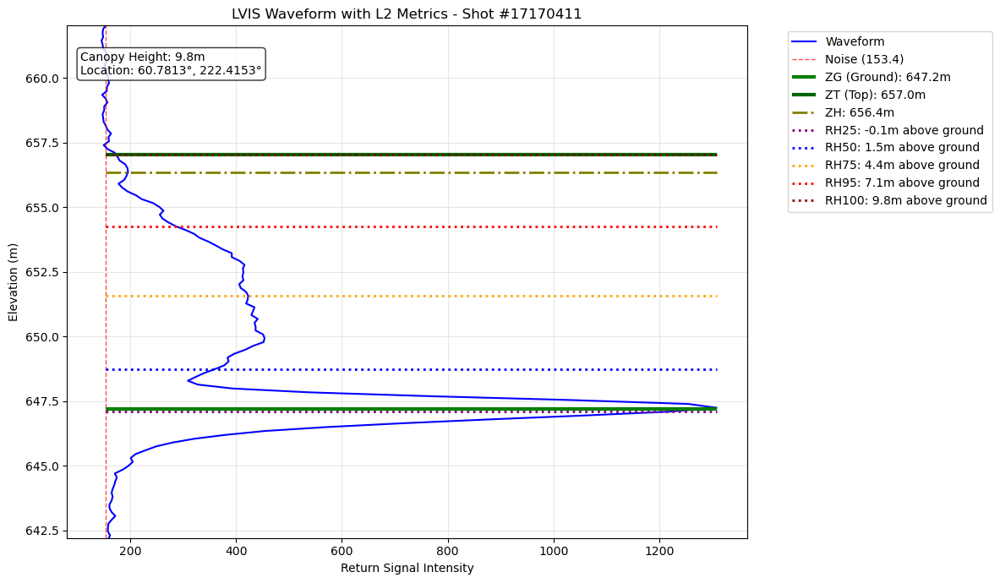

L2 metrics for shot 17170411:
  Ground elevation (ZG): 647.2 m
  Top of canopy (ZT): 657.0 m
  Canopy height: 9.8 m


In [7]:
# Overlay ground elevation and canopy metrics

if l2_file_path and os.path.exists(l2_file_path) and 'RXWAVE' in h5_file:
    print(f"Loading L2 data from: {l2_file_path}")
    
    # Read L2 file header to find columns
    with open(l2_file_path, 'r') as f:
        # Find header line (usually starts with #)
        for line in f:
            if line.startswith('#'):
                header_line = line
            else:
                break
        
        # Get column names
        columns = header_line[1:].strip().split()
        print(f"L2 columns found: {columns}")
    
    # Read L2 data - simple approach for beginners
    l2_data = []
    with open(l2_file_path, 'r') as f:
        for line in f:
            if not line.startswith('#'):
                values = line.strip().split()
                l2_data.append(values)
    
    # Find the shot in L2 data
    shot_found = False
    for row in l2_data:
        if int(row[columns.index('SHOTNUMBER')]) == shot_numbers[example_shot_index]:
            # Extract L2 metrics
            zg = float(row[columns.index('ZG')])  # Ground elevation
            zt = float(row[columns.index('ZT')])  # Top of canopy
            
            zh = float(row[columns.index('ZH')]) if 'ZH' in columns else None # Not all L2 data have ZH
            rh25 = float(row[columns.index('RH25')]) if 'RH25' in columns else None
            rh50 = float(row[columns.index('RH50')]) if 'RH50' in columns else None
            rh75 = float(row[columns.index('RH75')]) if 'RH75' in columns else None
            rh95 = float(row[columns.index('RH95')]) if 'RH95' in columns else None
            rh100 = float(row[columns.index('RH100')]) if 'RH100' in columns else None
            
            shot_found = True
            break
    
    if shot_found:
        # Create enhanced plot with L2 metrics
        plt.figure(figsize=(12, 7))
        
        # Plot waveform
        plt.plot(waveform, elevations, 'b-', linewidth=1.5, label='Waveform')
        
        # Plot noise level
        plt.axvline(x=sigmean, color='red', linestyle='--', linewidth=1, 
                    label=f'Noise ({sigmean:.1f})', alpha=0.7)
        
        # Plot L2 metrics as horizontal lines
        # Use signal range for line extent
        signal_start = sigmean
        signal_end = np.max(waveform)
        
        # Ground elevation (solid green)
        plt.hlines(zg, signal_start, signal_end, colors='green', 
                   linewidth=3, label=f'ZG (Ground): {zg:.1f}m')
        

        # Top of canopy (solid dark green)
        plt.hlines(zt, signal_start, signal_end, colors='darkgreen', 
                   linewidth=3, label=f'ZT (Top): {zt:.1f}m')
        
        # Optional metrics if available
        if zh:
            plt.hlines(zh, signal_start, signal_end, colors='olive', 
                       linewidth=2, linestyle='-.', label=f'ZH: {zh:.1f}m')
        
        # RH metrics (heights above ground) - dotted lines
        rh_colors = {'RH25': 'purple', 'RH50': 'blue', 'RH75': 'orange', 
                     'RH95': 'red', 'RH100': 'darkred'}
        
        for rh_name, rh_value, color in [
            ('RH25', rh25, 'purple'),
            ('RH50', rh50, 'blue'),
            ('RH75', rh75, 'orange'),
            ('RH95', rh95, 'red'),
            ('RH100', rh100, 'darkred')
        ]:
            if rh_value:
                # RH values are heights above ground, so add to ZG
                rh_elevation = zg + rh_value
                plt.hlines(rh_elevation, signal_start, signal_end, 
                          colors=color, linewidth=2, linestyle=':', 
                          label=f'{rh_name}: {rh_value:.1f}m above ground')
        
        
        # Zoom to ground-to-canopy range
        plt.ylim(zg - 5, zt + 5)
        
        plt.xlabel('Return Signal Intensity')
        plt.ylabel('Elevation (m)')
        plt.title(f'LVIS Waveform with L2 Metrics - Shot #{shot_numbers[example_shot_index]}')
        plt.grid(True, alpha=0.3)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        
        # Add canopy height annotation
        canopy_height = zt - zg
        plt.text(0.02, 0.95, 
                f'Canopy Height: {canopy_height:.1f}m\nLocation: {lat0[example_shot_index]:.4f}°, {lon0[example_shot_index]:.4f}°',
                transform=plt.gca().transAxes, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        plt.tight_layout()
        plt.show()
        
        print(f"L2 metrics for shot {shot_numbers[example_shot_index]}:")
        print(f"  Ground elevation (ZG): {zg:.1f} m")
        print(f"  Top of canopy (ZT): {zt:.1f} m")
        print(f"  Canopy height: {canopy_height:.1f} m")
    else:
        print(f"Shot {shot_numbers[example_shot_index]} not found in L2 data")
        print("Showing waveform without L2 metrics")
else:
    if l2_file_path:
        print("L2 file not found or waveform data not available")
    else:
        print("No L2 file specified. Skip this cell or set l2_file_path to add L2 metrics.")

## 7. Calculate center points for all shots

In [ ]:
# Now let's look at all shots in the file

# Calculate center coordinates for all shots
center_lat = (lat0 + lat1215) / 2
center_lon = (lon0 + lon1215) / 2

# Convert from 0-360 to -180-180 for mapping
center_lon = np.where(center_lon > 180, center_lon - 360, center_lon)

print(f"Total shots in file: {len(shot_numbers)}")

# Show geographic extent
print(f"\nGeographic extent of valid shots:")
print(f"  Latitude:  {np.min(center_lat):.4f}° to {np.max(center_lat):.4f}°")
print(f"  Longitude: {np.min(center_lon):.4f}° to {np.max(center_lon):.4f}°")

Total shots in file: 350000

Geographic extent of valid shots:
  Latitude:  60.6386° to 60.7841°
  Longitude: -137.6071° to -137.2542°


## 8. Create a simple map showing shot locations

In [ ]:
# Display first 10000 shots
n_shots = 10000  # Number of shots to display

# Get coordinates based on display mode
# Use first N valid shots
display_lat = center_lat[0:n_shots]
display_lon = center_lon[0:n_shots]
print(f"Plotting first {len(display_lat)} shots out of {len(shot_numbers)} total")

# Create map centered on data
map_center_lat = np.mean(display_lat)
map_center_lon = np.mean(display_lon)

# Create folium map
lvis_map = folium.Map(
    location=[map_center_lat, map_center_lon],
    zoom_start=15,
    tiles='OpenStreetMap'
)

# Add shots as circle markers
for i in range(len(display_lat)):
    folium.CircleMarker(
        location=[display_lat[i], display_lon[i]],
        radius=2,
        popup=f"Shot {i}",
        color='red',
        fill=True,
        fillColor='red'
    ).add_to(lvis_map)

# Add marker for our example shot
example_lat = (lat0[example_shot_index] + lat1215[example_shot_index]) / 2
example_lon = (lon0[example_shot_index] + lon1215[example_shot_index]) / 2
if example_lon > 180:
    example_lon -= 360

folium.Marker(
    location=[example_lat, example_lon],
    popup=f"Example Shot #{shot_numbers[example_shot_index]}",
    icon=folium.Icon(color='green', icon='star')
).add_to(lvis_map)

print(f"Map centered at: {map_center_lat:.4f}, {map_center_lon:.4f}")
print(f"Green star shows the example shot we analyzed")
lvis_map

Plotting first 10000 shots out of 350000 total
Map centered at: 60.7741, -137.5891
Green star shows the example shot we analyzed


## 9. File summary and close

*Overall L1B file summary...*

In [13]:
print("LVIS Dataset Summary")
print("=" * 40)
print(f"Filename: {os.path.basename(h5_file_path)}")
print(f"Total shots: {len(shot_numbers):,}")
print(f"Date range: Shot {shot_numbers[0]} to {shot_numbers[-1]}")
print(f"\nGeographic extent:")
print(f"  Latitude:  {np.min(center_lat):.4f}° to {np.max(center_lat):.4f}°")
print(f"  Longitude: {np.min(center_lon):.4f}° to {np.max(center_lon):.4f}°")
print(f"\nElevation range:")
print(f"  Min: {np.min(z1215):.1f} m")
print(f"  Max: {np.max(z0):.1f} m")

# Add L2 metrics summary
if l2_file_path and os.path.exists(l2_file_path):
    print(f"\nL2 Metrics Summary:")
    print("-" * 40)
    
    # Read all L2 data for statistics
    l2_stats = {'ZG': [], 'ZT': [], 'ZH': [], 'RH25': [], 'RH50': [], 
                'RH75': [], 'RH95': [], 'RH100': []}
    
    with open(l2_file_path, 'r') as f:
        # Get header
        for line in f:
            if line.startswith('#'):
                columns = line[1:].strip().split()
            else:
                break
        
        # Read data
        for line in f:
            if not line.startswith('#'):
                values = line.strip().split()
                for metric in l2_stats.keys():
                    if metric in columns:
                        idx = columns.index(metric)
                        if idx < len(values):
                            val = float(values[idx])
                            l2_stats[metric].append(val)
    
    # Calculate and print statistics
    if l2_stats['ZG']:
        zg_array = np.array(l2_stats['ZG'])
        print(f"  Ground elevation (ZG):")
        print(f"    Mean: {np.mean(zg_array):.1f} m")
        print(f"    Range: {np.min(zg_array):.1f} to {np.max(zg_array):.1f} m")
    
    if l2_stats['ZT']:
        zt_array = np.array(l2_stats['ZT'])
        print(f"  Top of canopy (ZT):")
        print(f"    Mean: {np.mean(zt_array):.1f} m")
        print(f"    Range: {np.min(zt_array):.1f} to {np.max(zt_array):.1f} m")
    
    # Calculate canopy height statistics
    if l2_stats['ZG'] and l2_stats['ZT']:
        canopy_heights = zt_array - zg_array[:len(zt_array)]
        print(f"  Canopy height (ZT-ZG):")
        print(f"    Mean: {np.mean(canopy_heights):.1f} m")
        print(f"    Max: {np.max(canopy_heights):.1f} m")
        print(f"    Min: {np.min(canopy_heights[canopy_heights > 0]):.1f} m")
    
    # RH statistics (selected metrics)
    for rh in ['RH50', 'RH95']:
        if l2_stats[rh]:
            rh_array = np.array(l2_stats[rh])
            print(f"  {rh}:")
            print(f"    Mean: {np.mean(rh_array):.1f} m")
            print(f"    Max: {np.max(rh_array):.1f} m")

# Close the HDF5 file
h5_file.close()

LVIS Dataset Summary
Filename: LVISF1B_ABoVE2019_0731_R2003_066547.h5
Total shots: 350,000
Date range: Shot 17170311 to 17540073

Geographic extent:
  Latitude:  60.6386° to 60.7841°
  Longitude: -137.6071° to -137.2542°

Elevation range:
  Min: 546.9 m
  Max: 1052.7 m

L2 Metrics Summary:
----------------------------------------
  Ground elevation (ZG):
    Mean: 742.8 m
    Range: 589.0 to 912.2 m
  Top of canopy (ZT):
    Mean: 752.4 m
    Range: 590.3 to 927.0 m
  Canopy height (ZT-ZG):
    Mean: 9.6 m
    Max: 27.0 m
    Min: 0.3 m
  RH50:
    Mean: 0.9 m
    Max: 19.4 m
  RH95:
    Mean: 7.0 m
    Max: 25.3 m
